In [112]:
%matplotlib widget
import warnings
import inspect
import matplotlib.pyplot as plt
import IPython.display
import numpy as np
from cued_sf2_lab.familiarisation import load_mat_img, plot_image
from cued_sf2_lab.laplacian_pyramid import quantise

# 10. Selection of preferred energy compaction options

The remainder of this project will concentrate on developing the rest of
an image compression system, based on a few of the filtering /
transformation schemes studied so far.

Since the subsequent processes are non-linear, we cannot expect to be able to
choose precisely the right front-end at this stage, so we adopt the pragmatic
approach of picking about three good candidates and trust that one of these
will lead to a near-optimum solution in the end. Remember that up to this point we have only been using entropy to give us an _estimate_ of the number of bits required, the accuracy of which is affected by subsequent stages.

At this stage it is worth trying your schemes with all three
test images, (`Lighthouse`, `Bridge`, and `Flamingo`). You will find `Bridge` more difficult to compress than the other two. You may also want to introduce other images of your own.


In [113]:
lighthouse, _ = load_mat_img(img='lighthouse.mat', img_info='X')
bridge, _ = load_mat_img(img='bridge.mat', img_info='X')
flamingo, _ = load_mat_img(img='flamingo.mat', img_info='X')

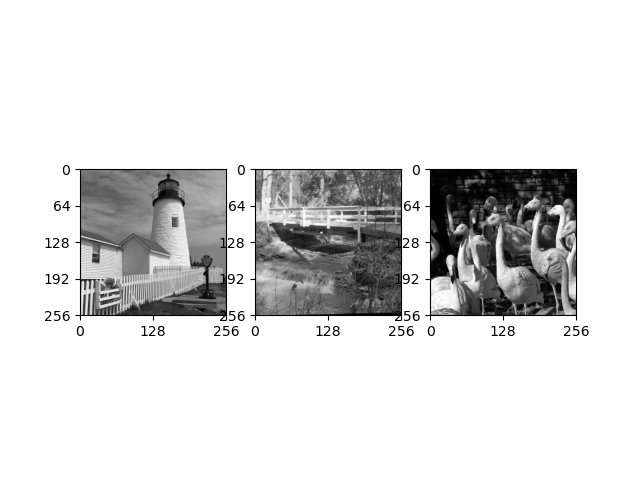

In [114]:
fig, axs = plt.subplots(1, 3)
plot_image(lighthouse, ax=axs[0])
plot_image(bridge, ax=axs[1])
plot_image(flamingo, ax=axs[2])

Write `.py` files to implement each of your
chosen schemes, so that you do not have to remember long sequences
of commands each time you run them. You can easily edit the M-files to introduce different options
later. Using plenty of comments in these files will help when you want to change them.


# 11. Centre-clipped linear quantisers

The quantisers that you have used so far have all been uniform quantisers
(i.e. all steps have been the same size). However the probability
distributions of the intensities of the bandpass sub-images from the energy
compaction front-ends are usually highly peaked at zero. The amount of data
compression depends heavily on the proportion of data samples which are
quantised to zero; if this approaches unity then high compression is
achieved.

Hence it is often found desirable to make the quantiser non-linear
so that more samples tend to be quantised to zero. A simple way
to achieve this is to widen the step-size of the "zero" step. In
a uniform quantiser, the "zero" step is normally centred on zero,
with rises to the next level at $\pm$ half of the step-size on
each side of zero. `quantise` allows a third argument `rise1` to be specified, which is
the point at which the first rise occurs on each side of the zero step. A
value of `rise1` = `step/2` is the default, but `rise1` = $\left\{0.5, 1, 1.5\right\}\times$ `step` are worth investigating. To show what effect these have, try:

```python
x = np.arange(-100, 100+1)
y = quantise(x, 20, rise1)
fig, ax = plt.subplots()
ax.plot(x, y)
ax.grid()
```


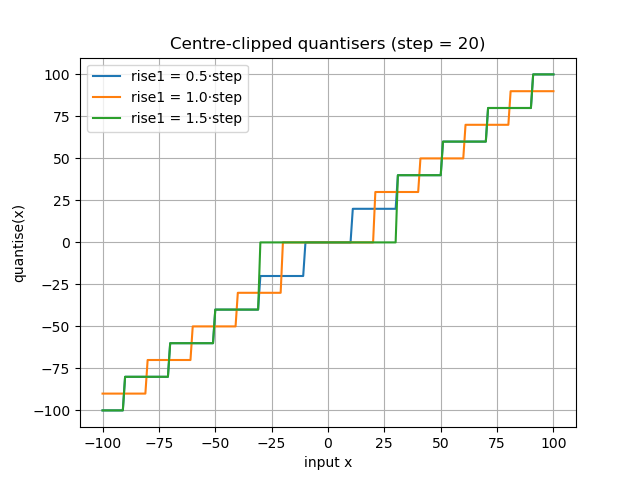

In [115]:
# Centre-clipped quantiser characteristics for a fixed step size.
# Increasing rise1 widens the zero step, so more samples are quantised to 0.
x = np.arange(-100, 100 + 1)
step = 20

fig, ax = plt.subplots()
for ratio in (0.5, 1.0, 1.5):
    ax.plot(x, quantise(x, step, ratio * step), label=f'rise1 = {ratio}·step')
ax.set(xlabel='input x', ylabel='quantise(x)',
       title=f'Centre-clipped quantisers (step = {step})')
ax.legend()
ax.grid()

The transfer characteristic is a staircase that is symmetric about zero, with a central **zero step of width `2·rise1`** while every outer step keeps width `step`:

- `rise1 = 0.5·step` reproduces the ordinary uniform quantiser (zero step width `= step`);
- `rise1 = step` doubles the width of the zero step — the _centre-clipped_ quantiser;
- `rise1 = 1.5·step` widens the dead-zone further still.

Only the dead-zone around zero grows. Because the band-pass sub-image histograms are sharply peaked at zero, widening this central step maps many more samples to zero, lowering the entropy — at the cost of a larger reconstruction error for the clipped samples.


A wider zero step means that more samples will be coded as zero and so the
entropy of the data will be reduced. The use of a wide zero step is
beneficial if it results in a better entropy vs. error tradeoff than a uniform
quantiser.

<div class="alert alert-block alert-danger">

For each of your preferred front-end
schemes, investigate the effects of varying the first rise of the
quantiser. To do this, you could plot how the quantising error
varies as a function of the number of bits for a few different ratios of
`rise1` to step-size, and hence find the ratio which gives the
best compression for a given rms error. </div>


### Centre-clipping across all four front-ends

We now repeat the first-rise sweep for each candidate energy-compaction front-end — the Laplacian pyramid, the 8×8 DCT, the 8×8 LBT and a 3-level DWT — reusing the encode / decode and per-band entropy helpers from notebook 9. Each method exposes `rms_bits(X, step, rise1)`, returning the reconstruction RMS error and the estimated total bits. All images are centred (`X − 128`), the convention the LBT post-filter relies on.


In [116]:
# Shared setup for the four front-ends (helpers adapted from notebook 9).
from cued_sf2_lab.dct import dct_ii, colxfm, regroup
from cued_sf2_lab.lbt import pot_ii
from cued_sf2_lab.dwt import dwt, idwt
from cued_sf2_lab.laplacian_pyramid import bpp, rowdec, rowint

Xl = lighthouse - 128.0           # centred images
Xb = bridge - 128.0
Xf = flamingo - 128.0
C8 = dct_ii(8)
Pf, Pr = pot_ii(8, 1.42)          # LBT pre / post-filter, s = 1.42
h_pyr = 0.25 * np.array([1, 2, 1])

steps = np.arange(2, 64, 0.5)     # quantiser steps to sweep (fine, for smooth curves)
ratios = (0.5, 1.0, 1.5)          # rise1 / step ratios to compare

# entropy of an N x N regrouped block transform, summed over its sub-bands
def dctbpp(Yr, N):
    sr, sc = Yr.shape[0] // N, Yr.shape[1] // N
    return sum(bpp(Yr[r*sr:(r+1)*sr, c*sc:(c+1)*sc]) * sr * sc
               for r in range(N) for c in range(N))

In [117]:
# --- Laplacian pyramid (k = 3) ---
def pykenc(X, h, k):
    Ys, Xk = [], X
    for _ in range(k):
        Xk_next = rowdec(rowdec(Xk, h).T, h).T
        Xk_hat = rowint(rowint(Xk_next, 2*h).T, 2*h).T
        Ys.append(Xk - Xk_hat); Xk = Xk_next
    return Ys, Xk

def pykdec(Ys, Xk, h):
    Z = Xk
    for Y in reversed(Ys):
        Z = rowint(rowint(Z, 2*h).T, 2*h).T + Y
    return Z

def pyr_rms_bits(X, step, rise1, k=3):
    Ys, Xk = pykenc(X, h_pyr, k)
    Ys_q = [quantise(Y, step, rise1) for Y in Ys]
    Xk_q = quantise(Xk, step, rise1)
    Z = pykdec(Ys_q, Xk_q, h_pyr)
    bits = sum(bpp(Yq) * Yq.size for Yq in Ys_q) + bpp(Xk_q) * Xk_q.size
    return np.std(X - Z), bits

In [118]:
# --- DCT 8x8 ---
def dct_rms_bits(X, step, rise1):
    Y = colxfm(colxfm(X, C8).T, C8).T
    Yq = quantise(Y, step, rise1)
    Z = colxfm(colxfm(Yq.T, C8.T).T, C8.T)
    return np.std(X - Z), dctbpp(regroup(Yq, 8), 8)

In [119]:
# --- LBT 8x8 (s = 1.42) ---
def lbt_enc(X, C, Pf):
    N = C.shape[0]; t = np.s_[N//2:-N//2]
    Xp = X.copy()
    Xp[t, :] = colxfm(Xp[t, :], Pf)
    Xp[:, t] = colxfm(Xp[:, t].T, Pf).T
    return colxfm(colxfm(Xp, C).T, C).T

def lbt_dec(Y, C, Pr):
    N = C.shape[0]; t = np.s_[N//2:-N//2]
    Z = colxfm(colxfm(Y.T, C.T).T, C.T)
    Zp = Z.copy()
    Zp[:, t] = colxfm(Zp[:, t].T, Pr.T).T
    Zp[t, :] = colxfm(Zp[t, :], Pr.T)
    return Zp

def lbt_rms_bits(X, step, rise1):
    Yq = quantise(lbt_enc(X, C8, Pf), step, rise1)
    return np.std(X - lbt_dec(Yq, C8, Pr)), dctbpp(regroup(Yq, 8), 8)

In [120]:
# --- DWT (n = 3) ---
def nlevdwt(X, n):
    Y = X.copy().astype(float); m = Y.shape[0]
    for _ in range(n):
        Y[:m, :m] = dwt(Y[:m, :m]); m //= 2
    return Y

def nlevidwt(Y, n):
    Z = Y.copy().astype(float); m = Z.shape[0] // 2**(n - 1)
    for _ in range(n):
        Z[:m, :m] = idwt(Z[:m, :m]); m *= 2
    return Z

def dwt_rms_bits(X, step, rise1, n=3):
    Y = nlevdwt(X, n); m = Y.shape[0]
    Yq = Y.copy(); bits = 0.0
    for i in range(n):
        mi = m // 2**i; h = mi // 2
        for rs, cs in [(slice(0, h), slice(h, mi)), (slice(h, mi), slice(0, h)), (slice(h, mi), slice(h, mi))]:
            Yq[rs, cs] = quantise(Y[rs, cs], step, rise1)
            bits += bpp(Yq[rs, cs]) * h * h
    mn = m // 2**n
    Yq[:mn, :mn] = quantise(Y[:mn, :mn], step, rise1)
    bits += bpp(Yq[:mn, :mn]) * mn * mn
    return np.std(X - nlevidwt(Yq, n)), bits

# collect the four front-ends for the comparison plots
SCHEMES = {'Pyramid (k=3)': pyr_rms_bits, 'DCT 8×8': dct_rms_bits,
           'LBT 8×8': lbt_rms_bits, 'DWT (n=3)': dwt_rms_bits}

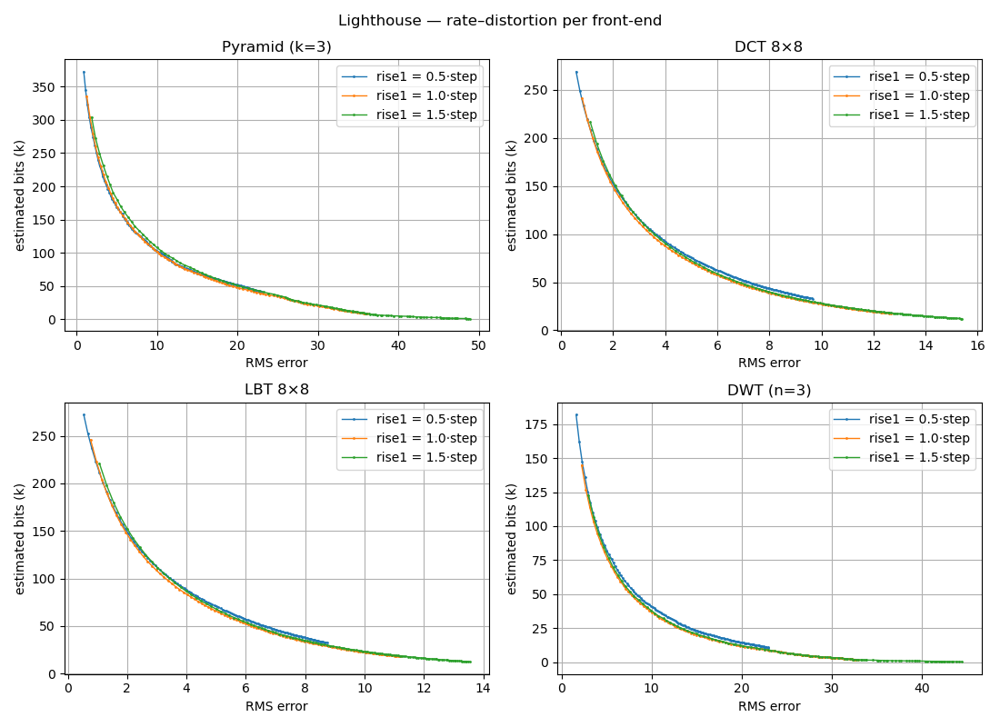

In [121]:
# Lighthouse: rate-distortion (bits vs RMS) per method, three first-rise ratios each.
fig, axs = plt.subplots(2, 2, figsize=(11, 8))
for ax, (name, fn) in zip(axs.ravel(), SCHEMES.items()):
    for ratio in ratios:
        rd = np.array([fn(Xl, s, ratio * s) for s in steps])
        ax.plot(rd[:, 0], rd[:, 1] / 1000, '.-', ms=2, lw=1, label=f'rise1 = {ratio}·step')
    ax.set(xlabel='RMS error', ylabel='estimated bits (k)', title=name)
    ax.legend(); ax.grid(True)
fig.suptitle('Lighthouse — rate–distortion per front-end')
fig.tight_layout()

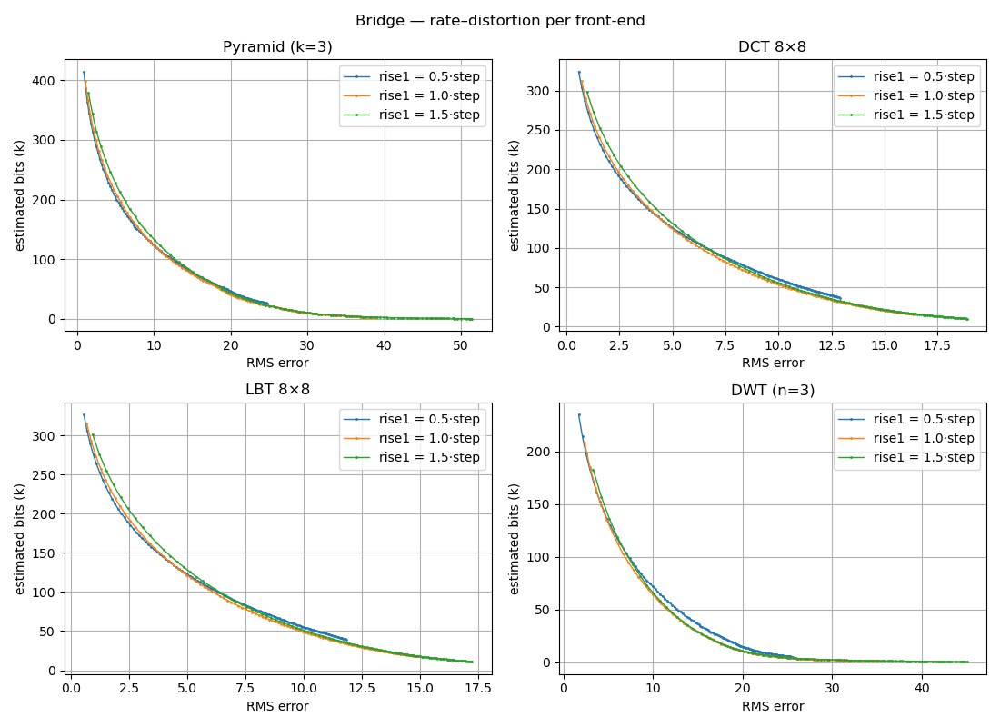

In [122]:
# Bridge: rate-distortion (bits vs RMS) per method, three first-rise ratios each.
fig, axs = plt.subplots(2, 2, figsize=(11, 8))
for ax, (name, fn) in zip(axs.ravel(), SCHEMES.items()):
    for ratio in ratios:
        rd = np.array([fn(Xb, s, ratio * s) for s in steps])
        ax.plot(rd[:, 0], rd[:, 1] / 1000, '.-', ms=2, lw=1, label=f'rise1 = {ratio}·step')
    ax.set(xlabel='RMS error', ylabel='estimated bits (k)', title=name)
    ax.legend(); ax.grid(True)
fig.suptitle('Bridge — rate–distortion per front-end')
fig.tight_layout()

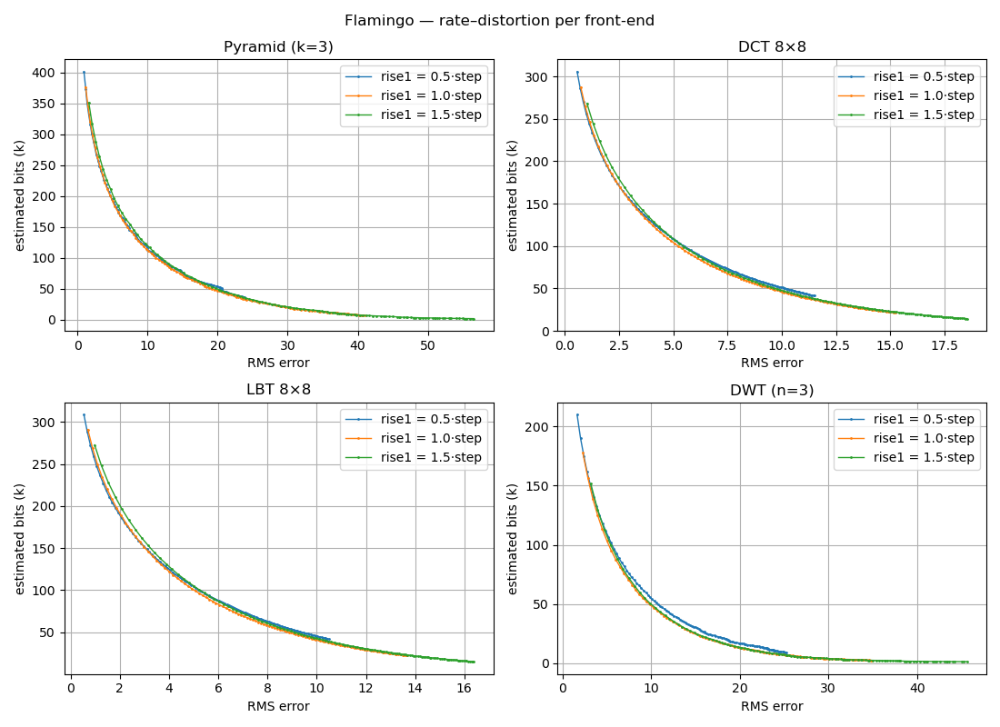

In [123]:
# Flamingo: rate-distortion (bits vs RMS) per method, three first-rise ratios each.
fig, axs = plt.subplots(2, 2, figsize=(11, 8))
for ax, (name, fn) in zip(axs.ravel(), SCHEMES.items()):
    for ratio in ratios:
        rd = np.array([fn(Xf, s, ratio * s) for s in steps])
        ax.plot(rd[:, 0], rd[:, 1] / 1000, '.-', ms=2, lw=1, label=f'rise1 = {ratio}·step')
    ax.set(xlabel='RMS error', ylabel='estimated bits (k)', title=name)
    ax.legend(); ax.grid(True)
fig.suptitle('Flamingo — rate–distortion per front-end')
fig.tight_layout()

In [124]:
# Matched-RMS comparison across all three images, on the same `steps` grid as the plots.
# For each image, steps are chosen so each method matches the RMS of direct
# quantisation at step 17; we then report bits vs a uniform quantiser (rise1 = 0.5*step).
images = {'Lighthouse': Xl, 'Bridge': Xb, 'Flamingo': Xf}

def matched_bits(fn, Xi, rms_ref):
    out = []
    for ratio in ratios:
        rd = np.array([fn(Xi, s, ratio * s) for s in steps])
        o = np.argsort(rd[:, 0])
        out.append(np.interp(rms_ref, rd[o, 0], rd[o, 1]))
    return out

print(f'{"% bits vs uniform":20s}' + ''.join(f'{f"{r}*step":>10s}' for r in ratios))
for iname, Xi in images.items():
    rms_ref = np.std(Xi - quantise(Xi, 17))
    print(f'{iname}  (RMS*={rms_ref:.2f})')
    for mname, fn in SCHEMES.items():
        b = matched_bits(fn, Xi, rms_ref)
        pct = ''.join(f'{(x-b[0])/b[0]*100:+9.1f}%' for x in b)
        print(f'   {mname:8s}{pct}')

% bits vs uniform     0.5*step  1.0*step  1.5*step
Lighthouse  (RMS*=4.86)
   Pyramid (k=3)     +0.0%     +0.9%     +7.1%
   DCT 8×8      +0.0%     -6.4%     -3.6%
   LBT 8×8      +0.0%     -6.8%     -3.6%
   DWT (n=3)     +0.0%     -6.2%     -3.0%
Bridge  (RMS*=4.92)
   Pyramid (k=3)     +0.0%     +3.8%    +11.7%
   DCT 8×8      +0.0%     -1.2%     +4.4%
   LBT 8×8      +0.0%     -1.2%     +4.7%
   DWT (n=3)     +0.0%     -1.0%     +4.4%
Flamingo  (RMS*=4.94)
   Pyramid (k=3)     +0.0%     -0.6%     +5.1%
   DCT 8×8      +0.0%     -3.9%     +0.2%
   LBT 8×8      +0.0%     -3.7%     +0.8%
   DWT (n=3)     +0.0%     -5.4%     -1.8%


At the lab's reference operating point — quantiser steps chosen so each method matches the RMS of **direct quantisation at step 17** (RMS ≈ 4.9 for all three images) — the bit change relative to a uniform quantiser (`rise1 = 0.5·step`), from the table above, is:

| front-end         | Lighthouse | Bridge | Flamingo |
| ----------------- | :--------: | :----: | :------: |
| Laplacian pyramid |   +0.9%    | +3.8%  |  −0.6%   |
| DCT 8×8           |   −6.4%    | −1.2%  |  −3.9%   |
| LBT 8×8           |   −6.8%    | −1.2%  |  −3.7%   |
| DWT (n=3)         |   −6.2%    | −1.0%  |  −5.4%   |

_(values are for `rise1 = step`; negative = fewer bits. `rise1 = 1.5·step` was worse on every case except the smooth Lighthouse.)_

For the **critically-sampled transforms** (DCT, LBT, DWT), a double-width zero step (`rise1 = step`) is best on every image, but the size of the win is strongly **image-dependent**: ≈ 6–7% on the smooth `Lighthouse`, ≈ 4–5% on `Flamingo`, but only ≈ 1% on the highly-textured `Bridge`, whose fine detail leaves few near-zero coefficients to push to zero. Widening further to `1.5·step` only helps on the easiest image and costs bits elsewhere. The **Laplacian pyramid** sees essentially no benefit (within ±1% at `rise1 = step`, always worse at `1.5·step`): it is over-complete and its band-pass residuals are not as sharply peaked at zero, so centre-clipping does not pay off.


Most current image compression standards use quantisers with a
double-width centre step (`rise1 = step`). Do not spend too much time
on this as the compression gains are likely to be quite small.

<div class="alert alert-block alert-danger">

Discuss whether your results indicate that `rise1 = step`
is a reasonable compromise if all quantisers are to be similar.

</div>


**Yes — for the transform front-ends.** For the DCT, LBT and DWT, `rise1 = step` is the best ratio on every image tested, saving bits at equal RMS (≈ 6–7% on `Lighthouse`, ≈ 4–5% on `Flamingo`, ≈ 1% on the busy `Bridge`), never doing significantly worse than the uniform quantiser, and avoiding the `rise1 = 1.5·step` penalty that appears as soon as the image carries much detail. This is exactly why most image-compression standards adopt a double-width centre step. The over-complete Laplacian pyramid is the exception — it gains nothing from centre-clipping and is best left uniform. So if a _single_ setting must serve everything, `rise1 = step` is the right compromise, though the gain shrinks on detailed images and per-sub-image tuning of `rise1` is not worth the effort.


A final strategy which you can consider is to completely suppress some
sub-images or DCT coefficients. This is equivalent to increasing `rise1`
to a very large value for these components. In the sub-images / coefficients
which represent only the highest horizontal and vertical frequency components
combined, the effects of suppression can be almost unnoticable and yet
a useful saving in number of bits can be achieved.

<div class="alert alert-block alert-danger">

Investigate any additional gains which can be achieved with suppression
of some sub-images / coefficients.

</div>


In [125]:
# Suppression = forcing whole sub-bands to zero (rise1 -> infinity), shown for the 8x8 DCT
# at step 17 with rise1 = step (the section-11 preferred setting). Bits use the same per-band dctbpp.
def dct_suppress(X, coords, step=17):
    inv = lambda Y: colxfm(colxfm(Y.T, C8.T).T, C8.T)
    Yq = quantise(colxfm(colxfm(X, C8).T, C8).T, step, step)
    r0, b0 = np.std(X - inv(Yq)), dctbpp(regroup(Yq, 8), 8)
    for i, j in coords:
        Yq[i::8, j::8] = 0
    return (np.std(X - inv(Yq)) - r0) / r0 * 100, (dctbpp(regroup(Yq, 8), 8) - b0) / b0 * 100

suppressions = {'(7,7) only': [(7, 7)],
                'bottom-right 3': [(7, 7), (6, 7), (7, 6)],
                'corner i+j>=11': [(i, j) for i in range(8) for j in range(8) if i + j >= 11]}

print(f'{"image":12s}{"suppressed":16s}{"dRMS":>9s}{"dbits":>9s}')
for iname, Xi in images.items():
    for desc, coords in suppressions.items():
        drms, dbits = dct_suppress(Xi, coords)
        print(f'{iname:12s}{desc:16s}{drms:+8.2f}%{dbits:+8.2f}%')

image       suppressed           dRMS    dbits
Lighthouse  (7,7) only         +0.40%   -0.30%
Lighthouse  bottom-right 3     +1.16%   -0.87%
Lighthouse  corner i+j>=11     +5.61%   -3.77%
Bridge      (7,7) only         +0.20%   -0.26%
Bridge      bottom-right 3     +0.90%   -0.99%
Bridge      corner i+j>=11     +4.28%   -4.21%
Flamingo    (7,7) only         +0.43%   -0.30%
Flamingo    bottom-right 3     +1.50%   -0.95%
Flamingo    corner i+j>=11     +7.35%   -4.16%


Suppression is the limiting case `rise1 → ∞` for chosen coefficients: they are forced to zero everywhere. The combined highest horizontal-and-vertical frequency coefficient — position `(7,7)` of each 8×8 DCT block — carries almost no visible energy, so removing it is near-imperceptible.

Measured on the centred 8×8 DCT at `step = 17` (`rise1 = step`), with the same per-band `dctbpp` used above (ΔRMS / Δbits vs the un-suppressed baseline):

| suppressed           |  Lighthouse   |    Bridge     |   Flamingo    |
| -------------------- | :-----------: | :-----------: | :-----------: |
| `(7,7)` only         | +0.4% / −0.3% | +0.2% / −0.3% | +0.4% / −0.3% |
| bottom-right 3 coefs | +1.2% / −0.9% | +0.9% / −1.0% | +1.5% / −1.0% |
| corner `i+j ≥ 11`    | +5.6% / −3.8% | +4.3% / −4.2% | +7.4% / −4.2% |

Suppressing the single highest-frequency coefficient is essentially free perceptually (≈ +0.2–0.4% RMS) but also saves little (≈ −0.3% bits), because at step 17 those sub-bands are already mostly quantised to zero. Pushing further — the whole `i+j ≥ 11` corner — saves ≈ 4% of the bits, but the RMS cost climbs steeply, especially on the detailed `Flamingo` (+7.4%).

The saving would be larger in the real run-length + Huffman coder (`jpegenc`), where zeroing _trailing_ coefficients lengthens zero-runs and brings the end-of-block code forward. So suppressing the one or two highest-frequency coefficients is a cheap, almost-lossless way to shave a little rate; suppressing the whole corner trades visible quality for only a modest extra saving.


## Reconstructed images

The rate–distortion curves and tables compare the methods numerically; here we look at the decoded images. For each test image the four front-ends (columns) are shown at all three first-rise ratios (**rows: `rise1 = 0.5 / 1.0 / 1.5 · step`**), each with its quantiser step chosen to match the RMS of direct quantisation at step 17 (≈ 4.9). Since every panel shares the same distortion, they differ only in _how_ they spread the error — and the bit-count under each panel shows `rise1 = step` giving the lowest rate at equal quality.


In [126]:
# Reconstruction (decoded image) for each method, reusing the encode/decode pieces above.
def dct_recon(X, step, rise1):
    Yq = quantise(colxfm(colxfm(X, C8).T, C8).T, step, rise1)
    return colxfm(colxfm(Yq.T, C8.T).T, C8.T)

def lbt_recon(X, step, rise1):
    return lbt_dec(quantise(lbt_enc(X, C8, Pf), step, rise1), C8, Pr)

def dwt_recon(X, step, rise1, n=3):
    Y = nlevdwt(X, n); m = Y.shape[0]; Yq = Y.copy()
    for i in range(n):
        mi = m // 2**i; h = mi // 2
        for rs, cs in [(slice(0, h), slice(h, mi)), (slice(h, mi), slice(0, h)), (slice(h, mi), slice(h, mi))]:
            Yq[rs, cs] = quantise(Y[rs, cs], step, rise1)
    mn = m // 2**n
    Yq[:mn, :mn] = quantise(Y[:mn, :mn], step, rise1)
    return nlevidwt(Yq, n)

def pyr_recon(X, step, rise1, k=3):
    Ys, Xk = pykenc(X, h_pyr, k)
    return pykdec([quantise(Y, step, rise1) for Y in Ys], quantise(Xk, step, rise1), h_pyr)

RECON = {'Pyramid (k=3)': pyr_recon, 'DCT 8×8': dct_recon, 'LBT 8×8': lbt_recon, 'DWT (n=3)': dwt_recon}

def matched_recon(name, Xi, rms_ref, ratio=1.0):
    """Reconstruct with `name` at the given rise1/step ratio, step interpolated to match rms_ref."""
    fn = RECON[name]
    grid = np.arange(2, 64, 1.0)
    rms = np.array([np.std(Xi - fn(Xi, s, ratio * s)) for s in grid])
    o = np.argsort(rms)
    best = float(np.interp(rms_ref, rms[o], grid[o]))   # step that hits rms_ref exactly
    Z = fn(Xi, best, ratio * best)
    bits = SCHEMES[name](Xi, best, ratio * best)[1]
    return Z, best, bits

Text(0.5, 0.98, 'Lighthouse — reconstructions at matched RMS ≈ 4.86 (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')

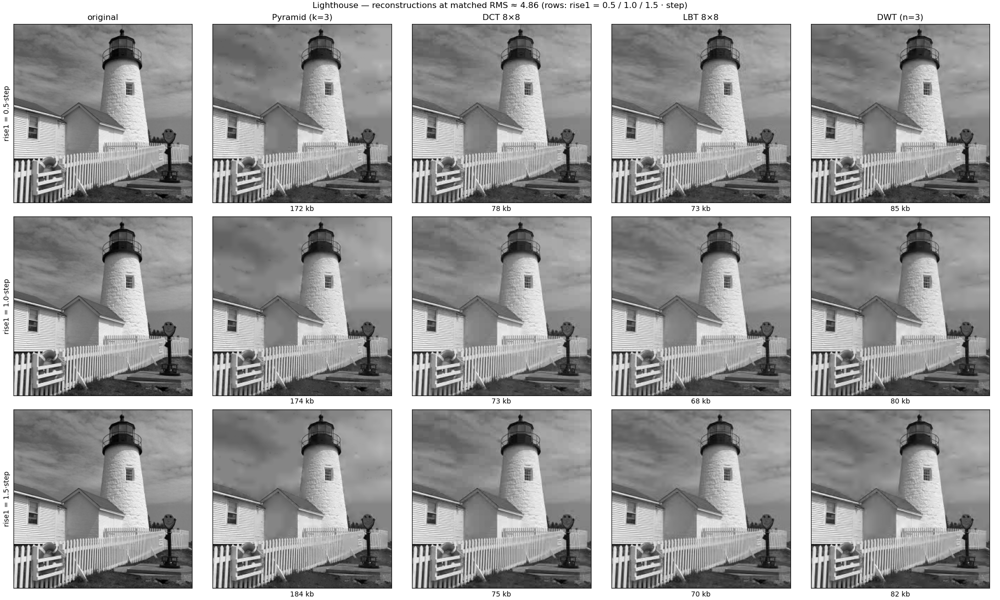

In [127]:
# Lighthouse: reconstructions matched to RMS, stacked by rise1 ratio (rows 0.5 / 1.0 / 1.5 · step).
Xi = Xl; rms_ref = np.std(Xi - quantise(Xi, 17))
ratios_show = (0.5, 1.0, 1.5)
methods = list(RECON)
fig, axs = plt.subplots(3, 5, figsize=(20, 12), constrained_layout=True)
for r, ratio in enumerate(ratios_show):
    plot_image(Xi, ax=axs[r, 0]); axs[r, 0].set(xticks=[], yticks=[], ylabel=f'rise1 = {ratio}·step')
    for col, name in enumerate(methods, start=1):
        Z, best, bits = matched_recon(name, Xi, rms_ref, ratio)
        plot_image(Z, ax=axs[r, col]); axs[r, col].set(xticks=[], yticks=[], xlabel=f'{bits/1000:.0f} kb')
for col, lbl in enumerate(['original'] + methods):
    axs[0, col].set_title(lbl)
fig.suptitle(f'Lighthouse — reconstructions at matched RMS ≈ {rms_ref:.2f} (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')

Text(0.5, 0.98, 'Bridge — reconstructions at matched RMS ≈ 4.92 (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')

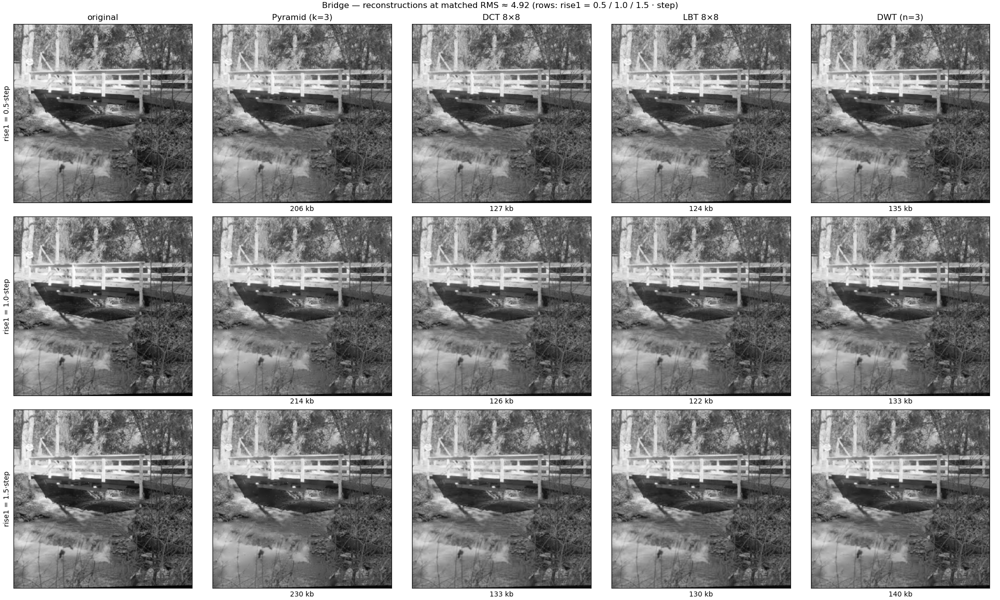

In [128]:
# Bridge: reconstructions matched to RMS, stacked by rise1 ratio (rows 0.5 / 1.0 / 1.5 · step).
Xi = Xb; rms_ref = np.std(Xi - quantise(Xi, 17))
ratios_show = (0.5, 1.0, 1.5)
methods = list(RECON)
fig, axs = plt.subplots(3, 5, figsize=(20, 12), constrained_layout=True)
for r, ratio in enumerate(ratios_show):
    plot_image(Xi, ax=axs[r, 0]); axs[r, 0].set(xticks=[], yticks=[], ylabel=f'rise1 = {ratio}·step')
    for col, name in enumerate(methods, start=1):
        Z, best, bits = matched_recon(name, Xi, rms_ref, ratio)
        plot_image(Z, ax=axs[r, col]); axs[r, col].set(xticks=[], yticks=[], xlabel=f'{bits/1000:.0f} kb')
for col, lbl in enumerate(['original'] + methods):
    axs[0, col].set_title(lbl)
fig.suptitle(f'Bridge — reconstructions at matched RMS ≈ {rms_ref:.2f} (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')

Text(0.5, 0.98, 'Flamingo — reconstructions at matched RMS ≈ 4.94 (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')

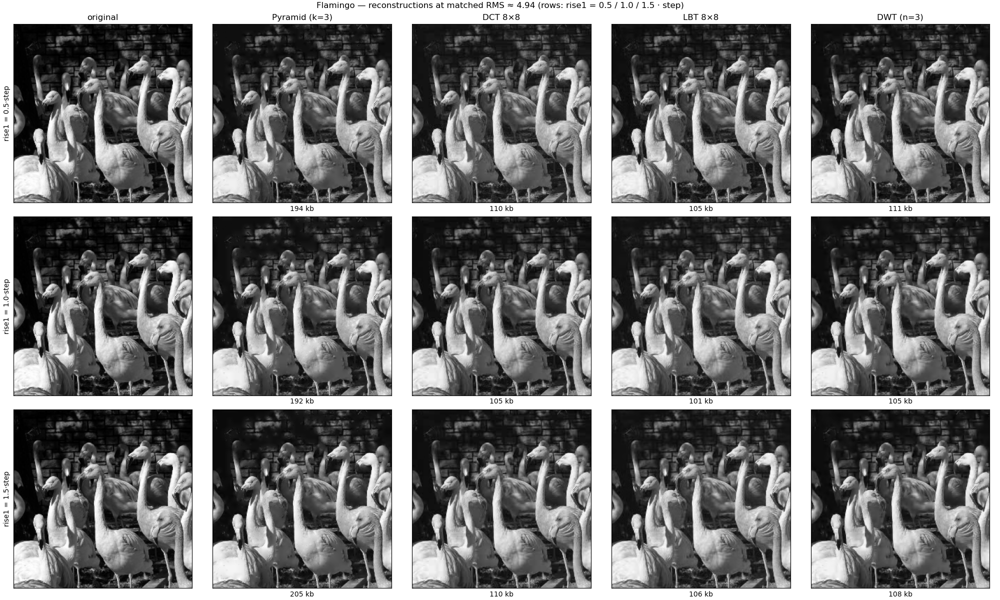

In [129]:
# Flamingo: reconstructions matched to RMS, stacked by rise1 ratio (rows 0.5 / 1.0 / 1.5 · step).
Xi = Xf; rms_ref = np.std(Xi - quantise(Xi, 17))
ratios_show = (0.5, 1.0, 1.5)
methods = list(RECON)
fig, axs = plt.subplots(3, 5, figsize=(20, 12), constrained_layout=True)
for r, ratio in enumerate(ratios_show):
    plot_image(Xi, ax=axs[r, 0]); axs[r, 0].set(xticks=[], yticks=[], ylabel=f'rise1 = {ratio}·step')
    for col, name in enumerate(methods, start=1):
        Z, best, bits = matched_recon(name, Xi, rms_ref, ratio)
        plot_image(Z, ax=axs[r, col]); axs[r, col].set(xticks=[], yticks=[], xlabel=f'{bits/1000:.0f} kb')
for col, lbl in enumerate(['original'] + methods):
    axs[0, col].set_title(lbl)
fig.suptitle(f'Flamingo — reconstructions at matched RMS ≈ {rms_ref:.2f} (rows: rise1 = 0.5 / 1.0 / 1.5 · step)')